# Sensor readings from a wall-following robot

dataset:https://www.kaggle.com/uciml/wall-following-robot
https://archive.ics.uci.edu/ml/machine-learning-databases/00194/


In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline

#### adding headers to all the 24 sensors and the class variable


In [2]:
df=pd.read_csv('sensor_readings_24.csv', header=None)
headerList = ['S1','S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20', 'S21' ,'S22', 'S23', 'S24','class'  ]
df.to_csv("newsensor_readings_24.csv", header=headerList, index=False)
df2 = pd.read_csv("newsensor_readings_24.csv")

In [3]:
df2

,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,...,S16,S17,S18,S19,S20,S21,S22,S23,S24,class
0,0.438,0.498,3.625,3.645,5.000,2.918,5.000,2.351,2.332,2.643,...,0.593,0.502,0.493,0.504,0.445,0.431,0.444,0.440,0.429,Slight-Right-Turn
1,0.438,0.498,3.625,3.648,5.000,2.918,5.000,2.637,2.332,2.649,...,0.592,0.502,0.493,0.504,0.449,0.431,0.444,0.443,0.429,Slight-Right-Turn
2,0.438,0.498,3.625,3.629,5.000,2.918,5.000,2.637,2.334,2.643,...,0.593,0.502,0.493,0.504,0.449,0.431,0.444,0.446,0.429,Slight-Right-Turn
3,0.437,0.501,3.625,3.626,5.000,2.918,5.000,2.353,2.334,2.642,...,0.593,0.502,0.493,0.504,0.449,0.431,0.444,0.444,0.429,Slight-Right-Turn
4,0.438,0.498,3.626,3.629,5.000,2.918,5.000,2.640,2.334,2.639,...,0.592,0.502,0.493,0.504,0.449,0.431,0.444,0.441,0.429,Slight-Right-Turn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,0.910,5.000,3.997,2.785,2.770,2.572,2.433,1.087,1.772,1.040,...,0.660,0.648,0.657,0.686,5.000,1.045,5.000,5.000,1.562,Move-Forward
5452,0.926,5.000,4.015,2.792,2.777,2.571,1.768,1.071,1.762,1.021,...,0.652,0.640,0.649,1.593,1.616,1.058,5.000,5.000,1.085,Sharp-Right-Turn
5453,0.937,5.000,4.034,2.799,2.784,2.571,1.754,1.053,1.752,1.002,...,0.648,0.633,0.642,0.741,5.000,1.065,5.000,5.000,1.105,Sharp-Right-Turn
5454,0.945,4.052,4.052,2.809,2.791,2.441,1.757,1.034,1.743,0.983,...,0.641,0.626,0.635,0.754,5.000,1.076,5.000,5.000,1.118,Move-Forward


In [4]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   S1      5456 non-null   float64
 1   S2      5456 non-null   float64
 2   S3      5456 non-null   float64
 3   S4      5456 non-null   float64
 4   S5      5456 non-null   float64
 5   S6      5456 non-null   float64
 6   S7      5456 non-null   float64
 7   S8      5456 non-null   float64
 8   S9      5456 non-null   float64
 9   S10     5456 non-null   float64
 10  S11     5456 non-null   float64
 11  S12     5456 non-null   float64
 12  S13     5456 non-null   float64
 13  S14     5456 non-null   float64
 14  S15     5456 non-null   float64
 15  S16     5456 non-null   float64
 16  S17     5456 non-null   float64
 17  S18     5456 non-null   float64
 18  S19     5456 non-null   float64
 19  S20     5456 non-null   float64
 20  S21     5456 non-null   float64
 21  S22     5456 non-null   float64
 22  

In [5]:
df2.describe()

,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,...,S15,S16,S17,S18,S19,S20,S21,S22,S23,S24
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,...,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.471617,2.327043,2.489347,2.796501,2.958552,2.893073,3.351113,2.540397,3.125621,2.832386,...,2.205772,1.202111,0.989831,0.910273,1.05811,1.076320,1.015923,1.778034,1.555045,1.578508
std,0.802801,1.410146,1.247435,1.309368,1.339225,1.282575,1.413692,1.111554,1.356965,1.307843,...,1.715435,1.098568,0.942075,0.889527,1.14463,1.141498,0.887439,1.571686,1.291447,1.150480
min,0.400000,0.437000,0.470000,0.833000,1.120000,1.114000,1.122000,0.859000,0.836000,0.810000,...,0.495000,0.424000,0.373000,0.354000,0.34000,0.355000,0.380000,0.370000,0.367000,0.377000
25%,0.921000,1.362000,1.538750,1.731000,1.774000,1.785750,1.930750,1.618000,1.799750,1.636000,...,0.860000,0.690000,0.581000,0.529750,0.52300,0.541750,0.567000,0.743000,0.792000,0.884000
50%,1.335000,1.904500,2.064000,2.458000,2.667000,2.682500,3.225500,2.172000,2.802000,2.679000,...,1.328500,0.803000,0.738000,0.685000,0.69100,0.693000,0.764000,1.030500,1.071000,1.289000
75%,1.814000,2.681500,2.739250,4.093500,4.314500,3.835250,5.000000,3.193000,5.000000,3.526250,...,4.436250,1.159000,0.913000,0.837000,0.85700,0.863000,1.002250,2.068250,1.559500,1.657250
max,5.000000,5.025000,5.029000,5.017000,5.000000,5.005000,5.008000,5.087000,5.000000,5.022000,...,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000


In [6]:
df2.shape

(5456, 25)

In [7]:
df2.isnull().sum()

S1       0
S2       0
S3       0
S4       0
S5       0
S6       0
S7       0
S8       0
S9       0
S10      0
S11      0
S12      0
S13      0
S14      0
S15      0
S16      0
S17      0
S18      0
S19      0
S20      0
S21      0
S22      0
S23      0
S24      0
class    0
dtype: int64

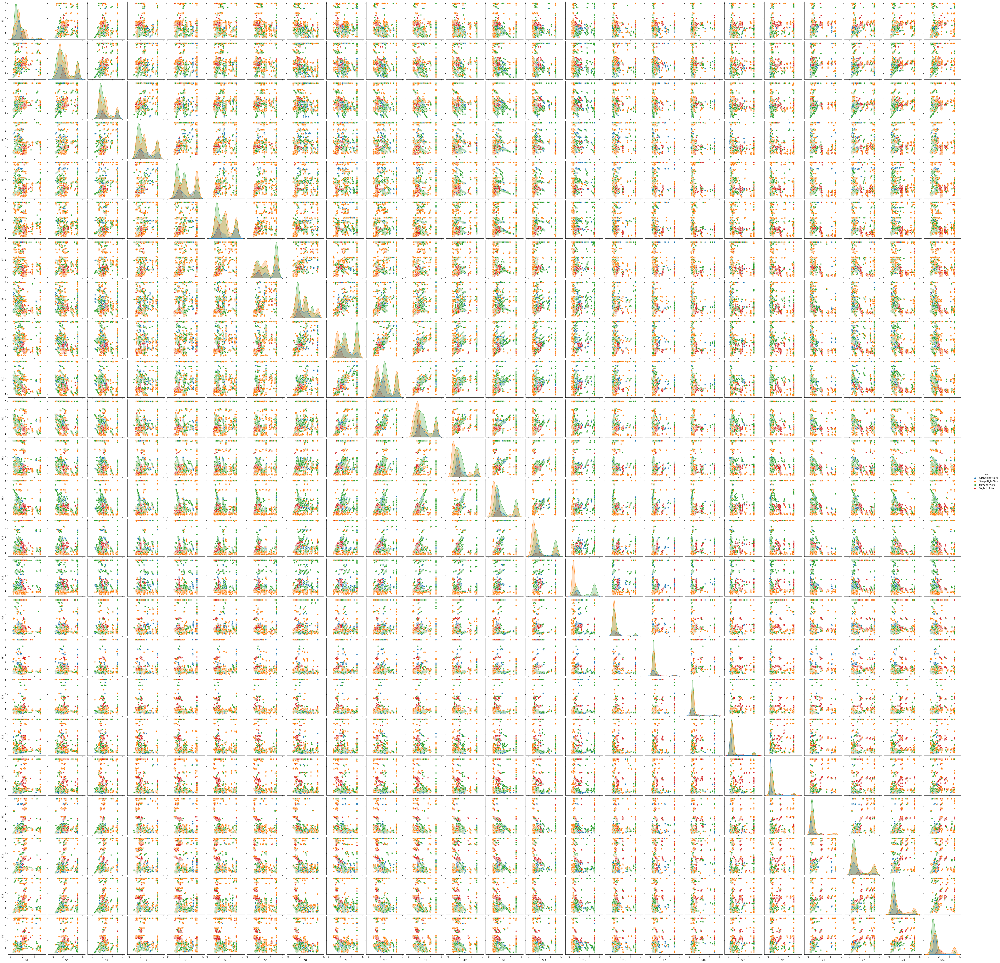

In [8]:
sb.pairplot(df2,hue='class')

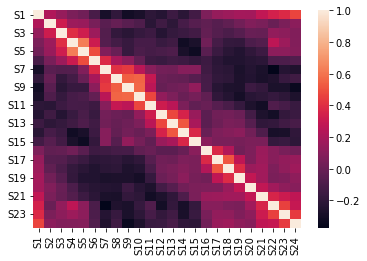

In [9]:
sb.heatmap(df2.corr()) 
plt.show()

### assigning input attributes and output attributes separately

In [10]:
X=df2.drop(['class'],axis=1)
y=df2['class']

In [36]:
rank = []

# Now logistic regression

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)##80:20 train:test ratio
logistic = LogisticRegression()
logistic.fit(X_train,y_train)
y_predict = logistic.predict(X_test)
y_predict = logistic.predict(X_test)

C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [38]:
print('Accuracy:',accuracy_score(y_test,y_predict))
print('Classification Report',classification_report(y_test,y_predict))
score2 = accuracy_score(y_test,y_predict)
rank.append([score2,"Logistic regression"])

Accuracy: 0.6794871794871795
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.72      0.70      0.71       444
 Sharp-Right-Turn       0.67      0.76      0.71       412
 Slight-Left-Turn       0.56      0.55      0.55        60
Slight-Right-Turn       0.64      0.46      0.54       176

         accuracy                           0.68      1092
        macro avg       0.65      0.62      0.63      1092
     weighted avg       0.68      0.68      0.68      1092



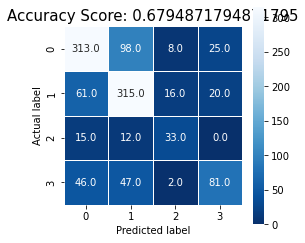

In [39]:
plt.figure(figsize=(4,4))
sb.heatmap(confusion_matrix(y_test,y_predict), annot=True, fmt=".1f", linewidths=.90, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test, y_predict))
plt.title(all_sample_title, size = 15);

## Now decision tree

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)##70:30 train:test ratio
tree=DecisionTreeClassifier(criterion="entropy")
tree.fit(X_train,y_train)
treeprediction=tree.predict(X_test)

In [41]:
print('Accuracy:',accuracy_score(y_test,treeprediction))
print('Classification Report',classification_report(y_test,treeprediction))
score3 = accuracy_score(y_test,treeprediction)
rank.append([score3,"decision tree"])

Accuracy: 0.998167379352474
Classification Report                    precision    recall  f1-score   support

     Move-Forward       1.00      1.00      1.00       647
 Sharp-Right-Turn       1.00      1.00      1.00       637
 Slight-Left-Turn       0.99      0.99      0.99       103
Slight-Right-Turn       1.00      1.00      1.00       250

         accuracy                           1.00      1637
        macro avg       1.00      1.00      1.00      1637
     weighted avg       1.00      1.00      1.00      1637



## Now naive bayes

In [42]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.5)##50:50 train:test ratio
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred=gnb.predict(X_test)

In [43]:
print("Accuracy is :",accuracy_score(y_test,y_pred))
print('Classification Report',classification_report(y_test,y_pred))
score4 = accuracy_score(y_test,y_pred)
rank.append([score4,"naive bayes"])

Accuracy is : 0.5417888563049853
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.67      0.48      0.56      1052
 Sharp-Right-Turn       0.69      0.43      0.53      1070
 Slight-Left-Turn       0.48      0.94      0.63       186
Slight-Right-Turn       0.35      0.79      0.49       420

         accuracy                           0.54      2728
        macro avg       0.55      0.66      0.55      2728
     weighted avg       0.62      0.54      0.54      2728



## Now KNN classification

In [44]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)##80:20 train:test ratio
neighbors = np.arange(1,25)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
for i,k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

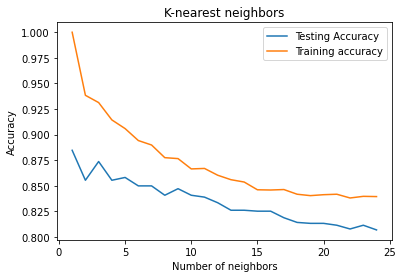

In [45]:
plt.title('K-nearest neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [46]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.8736263736263736

In [47]:
y_predict_knn = knn.predict(X_test)
print("Accuracy is :",accuracy_score(y_test,y_predict_knn))
print('Classification Report',classification_report(y_test,y_predict_knn))
score5 = accuracy_score(y_test,y_predict_knn)
rank.append([score5,"K-nearest neighbors"])

Accuracy is : 0.8736263736263736
Classification Report                    precision    recall  f1-score   support

     Move-Forward       0.87      0.87      0.87       458
 Sharp-Right-Turn       0.88      0.88      0.88       404
 Slight-Left-Turn       0.90      0.94      0.92        69
Slight-Right-Turn       0.86      0.82      0.84       161

         accuracy                           0.87      1092
        macro avg       0.88      0.88      0.88      1092
     weighted avg       0.87      0.87      0.87      1092



## Compare the results

In [49]:
rank=sorted(rank, reverse = True)
for i in range(len(rank)):
    print(str(i+1)+"-" + str(rank[i][1])+" with an accuracy of : "+ str(round(rank[i][0]*100,2))+"%")

1-decision tree with an accuracy of : 99.82%
2-K-nearest neighbors with an accuracy of : 87.36%
3-Logistic regression with an accuracy of : 67.95%
4-naive bayes with an accuracy of : 54.18%


# Hyperparameter Tuning

**decision tree**

In [51]:
from sklearn.model_selection import GridSearchCV

In [52]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(tree, param_grid, cv=5)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Best Parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Score: 0.99518768981788


#### Logistic Regression

In [53]:
c_space = np.logspace(-5, 8, 15)
param_grid = {'C': c_space}
 
# Instantiating logistic regression classifier
logreg = LogisticRegression()
 
# Instantiating the GridSearchCV object
logreg_cv = GridSearchCV(logreg, param_grid, cv = 5)
 
logreg_cv.fit(X_train, y_train)
print("Best Parameters:", logreg_cv.best_params_)
print("Best Score:", logreg_cv.best_score_)

C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

Best Parameters: {'C': 163789.3706954068}
Best Score: 0.6989007640005465


C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


# Ratio of the Data Model Test Accuracy

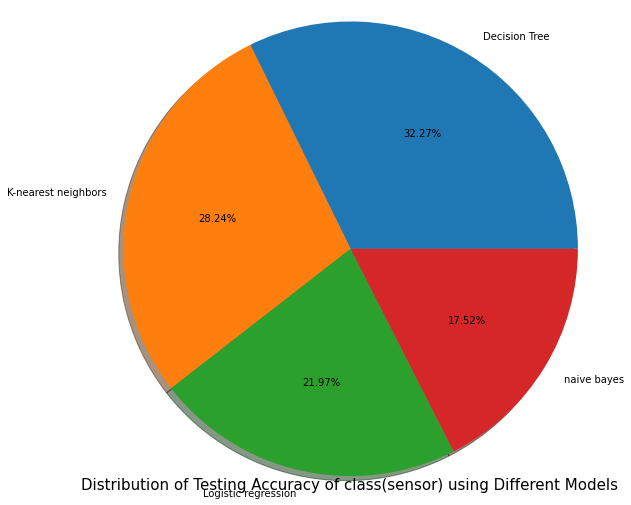

In [56]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(9, 9))
labels = 'Decision Tree','K-nearest neighbors','Logistic regression','naive bayes'
sizes = [score3,score5,score2,score4]

plt.pie(sizes, labels=labels, autopct='%.2f%%',shadow=True, startangle=0)
plt.axis('equal') 
plt.title("Distribution of Testing Accuracy of class(sensor) using Different Models",y=0,fontsize='15')
plt.show()